In [2]:
# Step 2: # Install Cosmos-Tokenizer and its Python dependencies.
import os
if os.path.exists("Cosmos-Tokenizer"):
    os.chdir("Cosmos-Tokenizer")
    %pip install -e .
else:
    print('Cosmos-Tokenizer is already installed.')

Note: you may need to restart the kernel to use updated packages.


c:\Users\xhaug\OneDrive\Desktop\ＣＭ１０７\Easy_LLM_Watermark\.venv\Scripts\python.exe: No module named pip


In [ ]:
from huggingface_hub import login, snapshot_download
import os
HUGGINGFACE_TOKEN = os.environ.get("HFb TOKEN")
login(token=HUGGINGFACE_TOKEN, add_to_git_credential=True)
model_names = [
        "Cosmos-0.1-Tokenizer-CI8x8",
]
for model_name in model_names:
    hf_repo = "nvidia/" + model_name
    local_dir = "pretrained_ckpts/" + model_name
    os.makedirs(local_dir, exist_ok=True)
    print(f"downloading {model_name}...")
    snapshot_download(repo_id=hf_repo, local_dir=local_dir)

downloading Cosmos-0.1-Tokenizer-CI8x8...


Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

Input image read from:	 c:\Users\xhaug\OneDrive\Desktop\ＣＭ１０７\Easy_LLM_Watermark\scripts/./Cosmos-Tokenizer/test_data/image.png
Reconstruction saved:	 c:\Users\xhaug\OneDrive\Desktop\ＣＭ１０７\Easy_LLM_Watermark\scripts/./Cosmos-Tokenizer/test_data/image_CI8x8.png


Input Image,Reconstructed Image

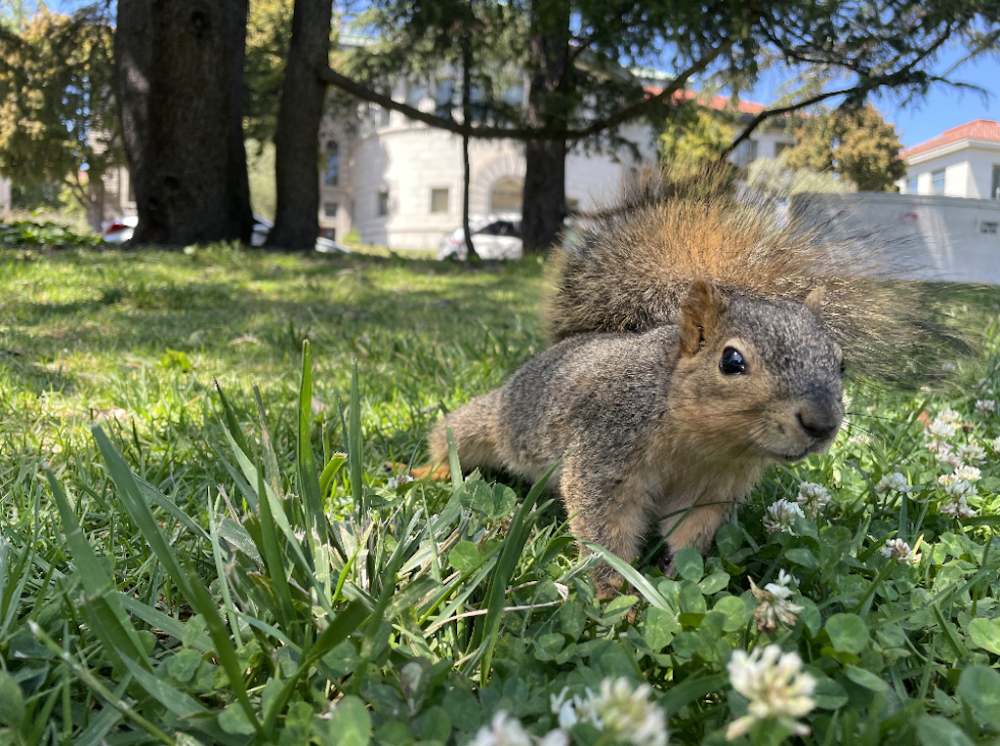
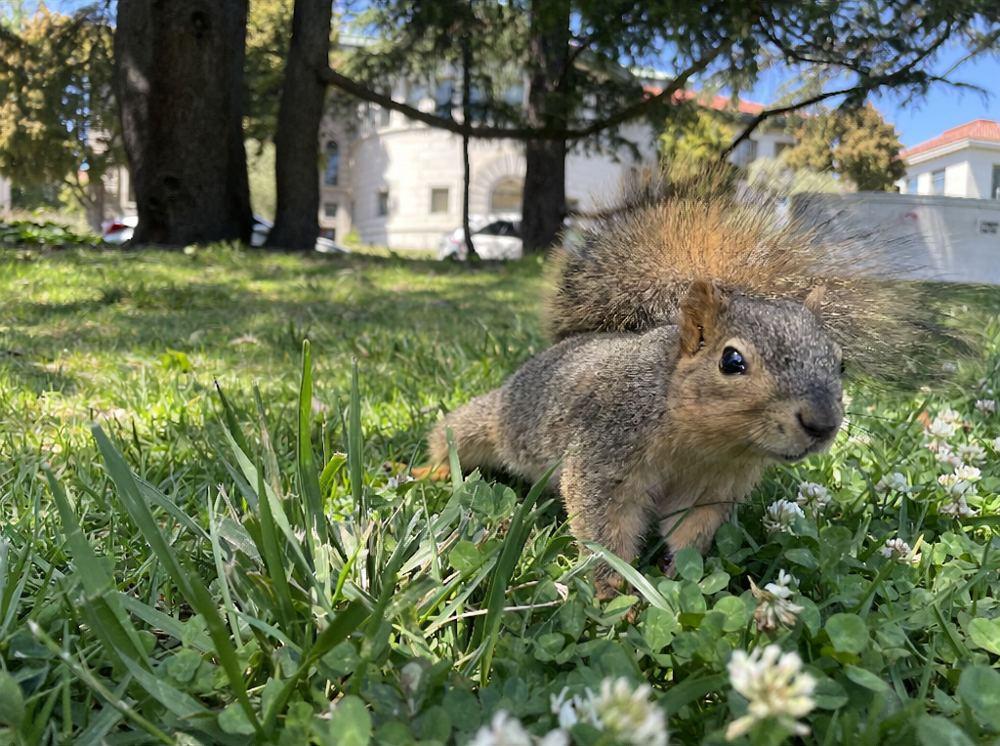

In [5]:
# @title In this step, load the required checkpoints, and perform image reconstruction. {"run":"auto"}
import cv2
import numpy as np
import torch
import os
import importlib
import cosmos_tokenizer.image_lib
import mediapy as media

importlib.reload(cosmos_tokenizer.image_lib)
from cosmos_tokenizer.image_lib import ImageTokenizer

# 1) Specify the model name, and the paths to the encoder/decoder checkpoints.
model_name = 'Cosmos-0.1-Tokenizer-CI8x8' # @param ["Cosmos-0.1-Tokenizer-CI16x16", "Cosmos-0.1-Tokenizer-CI8x8", "Cosmos-0.1-Tokenizer-DI8x8", "Cosmos-0.1-Tokenizer-DI16x16"]

encoder_ckpt = f"pretrained_ckpts/{model_name}/encoder.jit"
decoder_ckpt = f"pretrained_ckpts/{model_name}/decoder.jit"

# 2) Load or provide the image filename you want to tokenize & reconstruct.
input_filepath = "./Cosmos-Tokenizer/test_data/image.png"

# 3) Read the image from disk (shape = H x W x 3 in BGR). Then convert to RGB.
input_image = media.read_image(input_filepath)[..., :3]
assert input_image.ndim == 3 and input_image.shape[2] == 3, "Image must have shape H x W x 3"

# 4) Expand dimensions to B x H x W x C, since the ImageTokenizer expects a batch dimension
#    in the input. (Batch size = 1 in this example.)
batched_input_image = np.expand_dims(input_image, axis=0)

# 5) Create the ImageTokenizer instance with the encoder & decoder.
#    - device="cuda" uses the GPU
#    - dtype="bfloat16" expects Ampere or newer GPU (A100, RTX 30xx, etc.)
tokenizer = ImageTokenizer(
    checkpoint_enc=encoder_ckpt,
    checkpoint_dec=decoder_ckpt,
    device="cuda",
    dtype="bfloat16",
)

# 6) Use the tokenizer to autoencode (encode & decode) the image.
#    The output is a NumPy array with shape = B x H x W x C, range [0..255].
batched_output_image = tokenizer.forward(batched_input_image)

# 7) Extract the single image from the batch (index 0), convert to uint8.
output_image = batched_output_image[0]

# 9) Save the reconstructed image to disk.
input_dir, input_filename = os.path.split(input_filepath)
filename, ext = os.path.splitext(input_filename)
output_filepath = f"{input_dir}/{filename}_{model_name.split('-')[-1]}{ext}"
media.write_image(output_filepath, output_image)
print("Input image read from:\t", f"{os.getcwd()}/{input_filepath}")
print("Reconstruction saved:\t", f"{os.getcwd()}/{output_filepath}")

# 10) Visualization of the input image (left) and the reconstruction (right).
media.show_images([input_image, output_image], ["Input Image", "Reconstructed Image"])

In [2]:
import cv2
import numpy as np
import torch
import os
import importlib
import cosmos_tokenizer.image_lib
import mediapy as media
from cosmos_tokenizer.utils import (
    load_model,
    load_encoder_model,
    load_decoder_model,
    numpy2tensor,
    pad_image_batch,
    tensor2numpy,
    unpad_image_batch,
)


# 2) Load or provide the image filename you want to tokenize & reconstruct.
input_filepath = "./Cosmos-Tokenizer/test_data/image.png"

# 3) Read the image from disk (shape = H x W x 3 in BGR). Then convert to RGB.
input_image = media.read_image(input_filepath)[..., :3]
assert input_image.ndim == 3 and input_image.shape[2] == 3, "Image must have shape H x W x 3"

# 4) Expand dimensions to B x H x W x C, since the ImageTokenizer expects a batch dimension
#    in the input. (Batch size = 1 in this example.)
batched_input_image = np.expand_dims(input_image, axis=0)

padded_input_image, crop_region = pad_image_batch(batched_input_image)

In [7]:
device: str = "cuda"
dtype: str = "bfloat16"
input_tensor = numpy2tensor(
            padded_input_image, device=device
        )

In [9]:
input_tensor.shape

torch.Size([1, 3, 768, 1024])

In [13]:
import cv2
import numpy as np
import torch
import os
import importlib
import cosmos_tokenizer.image_lib
import mediapy as media

importlib.reload(cosmos_tokenizer.image_lib)
from cosmos_tokenizer.image_lib import ImageTokenizer


# 1) Specify the model name, and the paths to the encoder/decoder checkpoints.
model_name = 'Cosmos-0.1-Tokenizer-CI8x8' # @param ["Cosmos-0.1-Tokenizer-CI16x16", "Cosmos-0.1-Tokenizer-CI8x8", "Cosmos-0.1-Tokenizer-DI8x8", "Cosmos-0.1-Tokenizer-DI16x16"]

encoder_ckpt = f"pretrained_ckpts/{model_name}/encoder.jit"
decoder_ckpt = f"pretrained_ckpts/{model_name}/decoder.jit"

# 2) Load or provide the image filename you want to tokenize & reconstruct.
input_filepath = "./Cosmos-Tokenizer/test_data/image.png"


tokenizer = ImageTokenizer(
    checkpoint_enc=encoder_ckpt,
    checkpoint_dec=decoder_ckpt,
    device="cuda",
    dtype="bfloat16",
)


In [14]:
lentent = tokenizer.encode(input_tensor)

In [18]:
lentent[0].shape

torch.Size([1, 16, 96, 128])

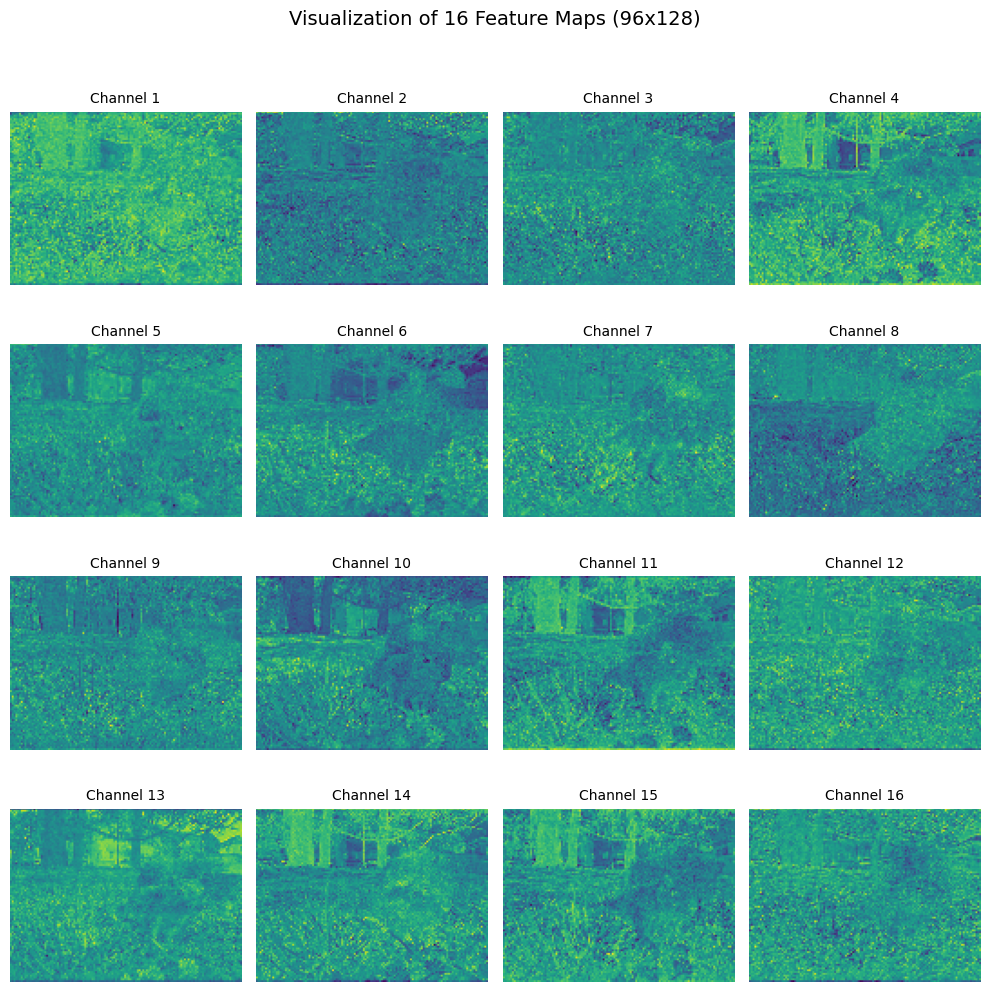

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# 1. MOCK DATA GENERATION: Create a NumPy array with the target shape (1, 16, 96, 128)
# We fill it with random values to simulate feature map activations.
# If you have a PyTorch tensor 'my_tensor', replace this line with:
# data = my_tensor.cpu().detach().numpy()
data = lentent[0].cpu()
data = data.to(torch.float32)
# 2. Extract the batch of feature maps (shape becomes 16, 96, 128)
feature_maps = data[0, :, :, :]
num_channels = feature_maps.shape[0] # Should be 16

# 3. Create a 4x4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(10, 10))
# Flatten the 4x4 array of axes for easy iteration
axes = axes.flatten()

# 4. Iterate over the 16 channels and plot each one
for i in range(num_channels):
    ax = axes[i]
    # Display the 96x128 feature map slice
    # Using 'viridis' cmap to visualize activation intensity
    ax.imshow(feature_maps[i], cmap='viridis')
    
    # Set title and turn off axis ticks/labels for a clean look
    ax.set_title(f'Channel {i+1}', fontsize=10)
    ax.axis('off')

# 5. Add a main title and adjust layout
fig.suptitle('Visualization of 16 Feature Maps (96x128)', fontsize=14, y=1.02)
plt.tight_layout()

# Save the visualization to a file
plt.savefig('16_feature_maps_visualization.png')

In [44]:
lentent = tokenizer.encode(input_tensor)[0]
print(lentent.shape)
lentent[0,8:,:,:] = torch.rand((96, 128))
output_tensor = tokenizer.decode(lentent)

torch.Size([1, 16, 96, 128])


In [45]:
output_tensor.shape
padded_output_image = tensor2numpy(output_tensor)
batched_output_image = unpad_image_batch(padded_output_image, crop_region)

Input image read from:	 c:\Users\xhaug\OneDrive\Desktop\ＣＭ１０７\Easy_LLM_Watermark\scripts/./Cosmos-Tokenizer/test_data/image.png
Reconstruction saved:	 c:\Users\xhaug\OneDrive\Desktop\ＣＭ１０７\Easy_LLM_Watermark\scripts/./Cosmos-Tokenizer/test_data/image_CI8x8.png


Input Image,Reconstructed Image

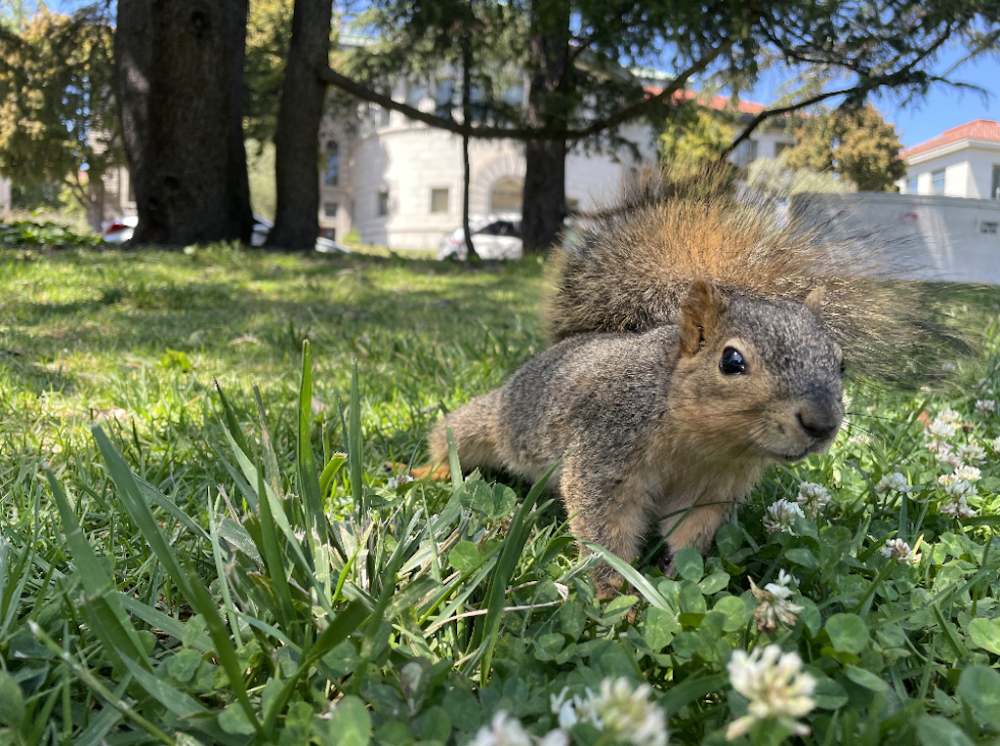
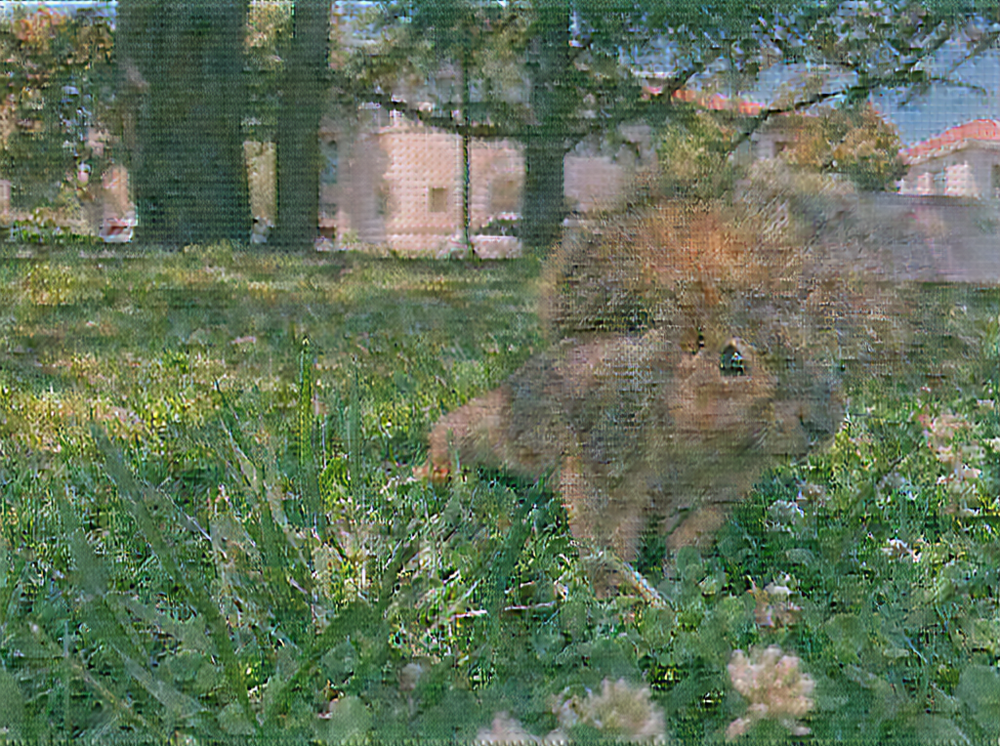

In [46]:
output_image = batched_output_image[0]

# 9) Save the reconstructed image to disk.
input_dir, input_filename = os.path.split(input_filepath)
filename, ext = os.path.splitext(input_filename)
output_filepath = f"{input_dir}/{filename}_{model_name.split('-')[-1]}{ext}"
media.write_image(output_filepath, output_image)
print("Input image read from:\t", f"{os.getcwd()}/{input_filepath}")
print("Reconstruction saved:\t", f"{os.getcwd()}/{output_filepath}")

# 10) Visualization of the input image (left) and the reconstruction (right).
media.show_images([input_image, output_image], ["Input Image", "Reconstructed Image"])